## 코드 살펴보기
해당 코드는 텐서플로우 공식 홈페이지의 튜토리얼에서 제시된 코드를 활용했습니다.

먼저 필요한 라이브러리를 불러옵니다.

In [46]:
!pip3 install tensorflow-estimator==2.6.0

In [47]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

이미지를 시각화하는 함수를 만들어 둡니다.

In [48]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수를 만들어둡니다.

In [49]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

Bounding Box를 만드는 함수를 만듭니다.

In [50]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수도 만듭니다.

In [51]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

이미지를 불러옵니다.

원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행해 보세요.

Image downloaded to /tmp/tmpqxkdo_ii.jpg.


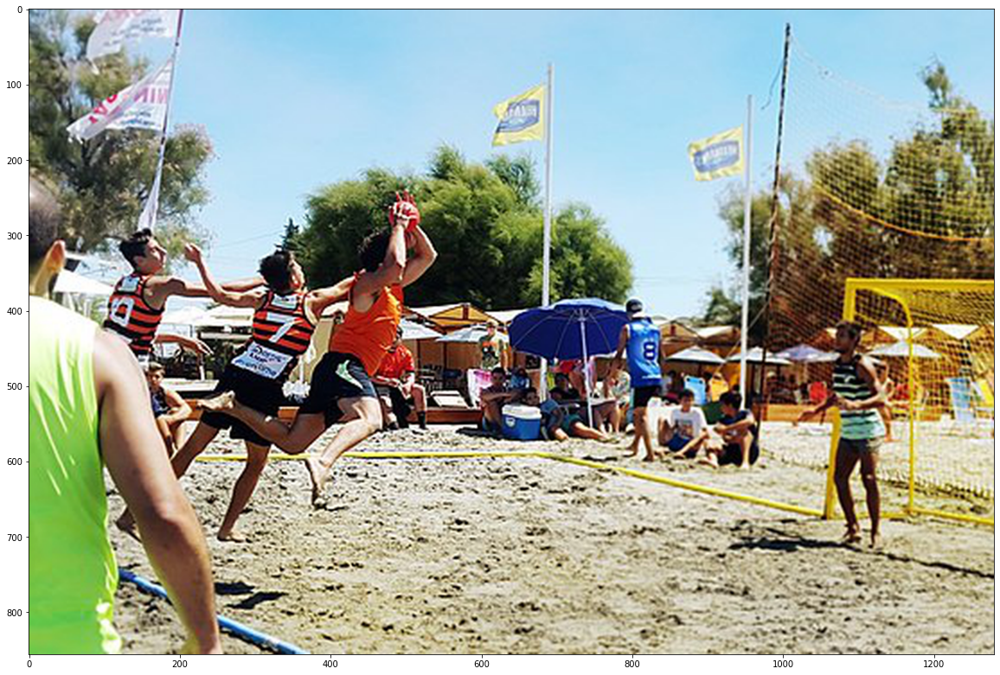

In [52]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러옵니다.

In [53]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [54]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.

In [55]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

detector를 실행시켜 봅시다.

Found 100 objects.
Inference time:  41.09905242919922


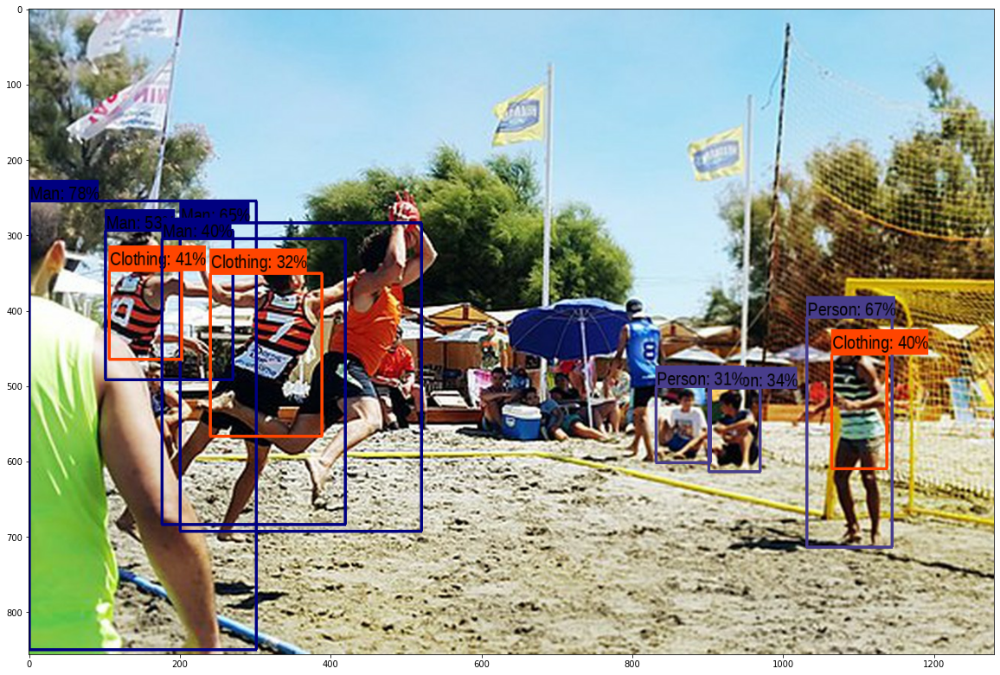

In [56]:
run_detector(detector, downloaded_image_path)

## 2-1. 다른 이미지 테스트해보기
원하는 이미지를 불러와 결과를 확인해 봅시다.

### '윌리를 찾아라'에서 사람 인식하기

Image downloaded to /tmp/tmpq9hhbt0v.jpg.


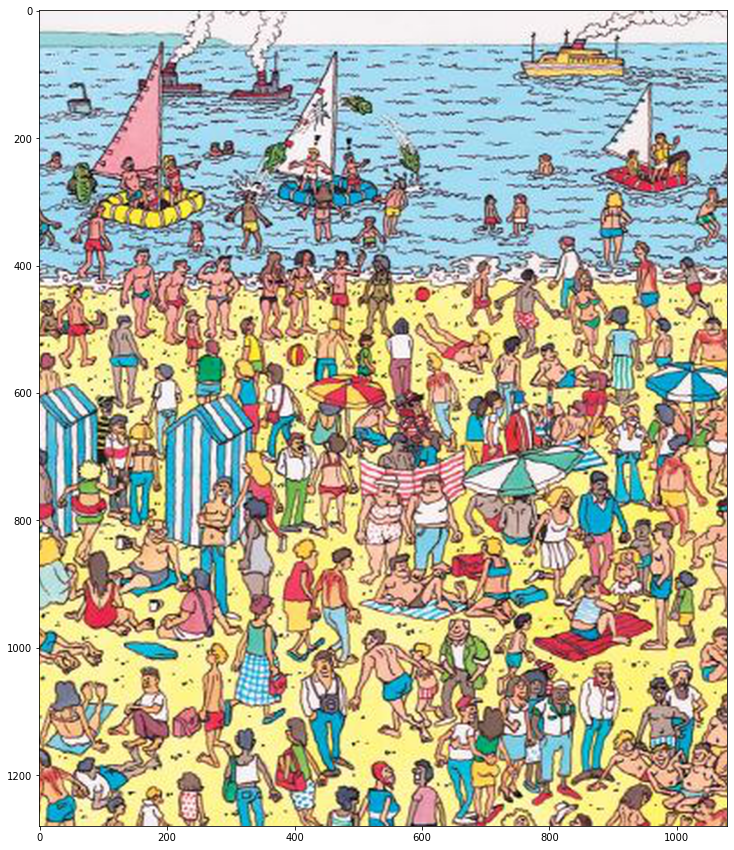

In [23]:
# 이미지 불러오기
# [[YOUR CODE]]
image_url = "https://cdn.gamey.kr/news/photo/201506/1624380_68023_2223.png"
downloaded_image_path = download_and_resize_image(image_url, 1080, 1280, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  2.918565273284912


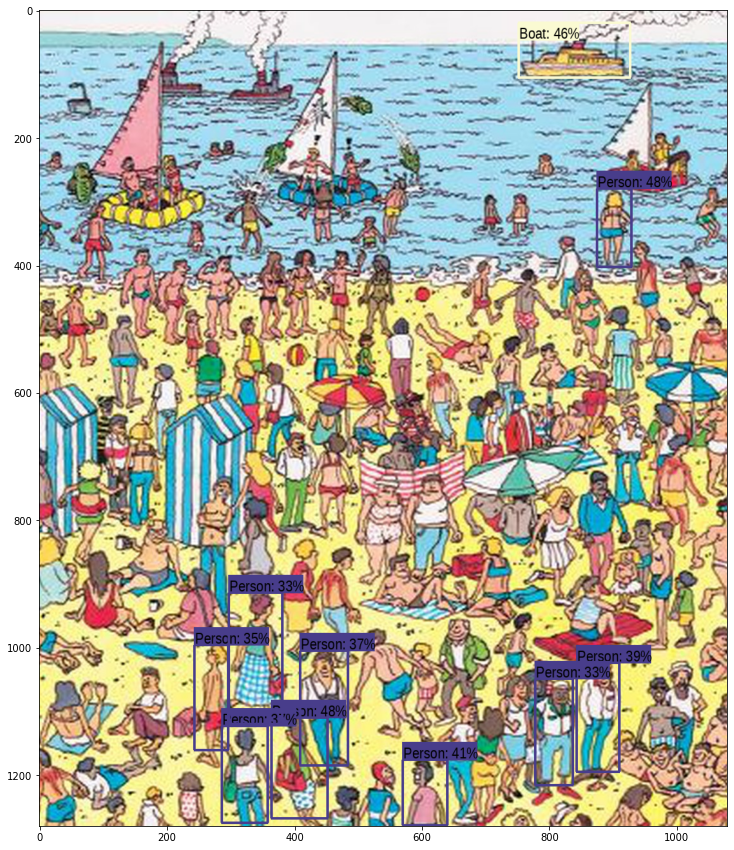

In [24]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

이렇게 사람이 많은데 사람 9명과 배 한 대 밖에 인식을 못했다. 그림이라서 그런가?

        
        
### 숨은 군인 12명 찾기

Image downloaded to /tmp/tmp8y0wb6_u.jpg.


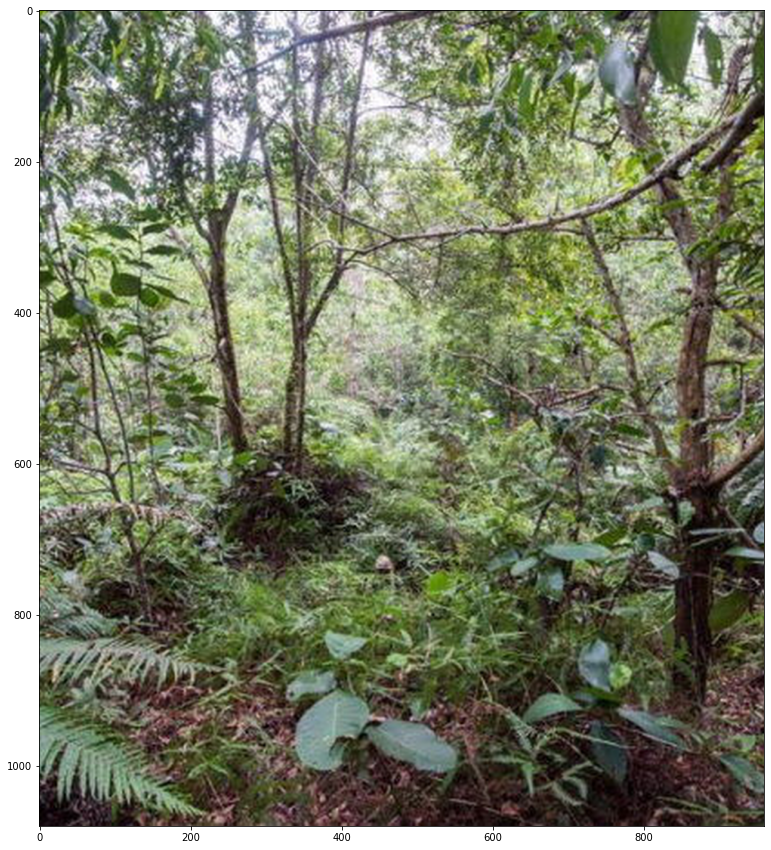

In [19]:
# 이미지 불러오기 
# [[YOUR CODE]]
image_url = "https://img.sbs.co.kr/newimg/news/20170221/201024759_1280.jpg"
downloaded_image_path = download_and_resize_image(image_url, 960, 1080, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  2.8902666568756104


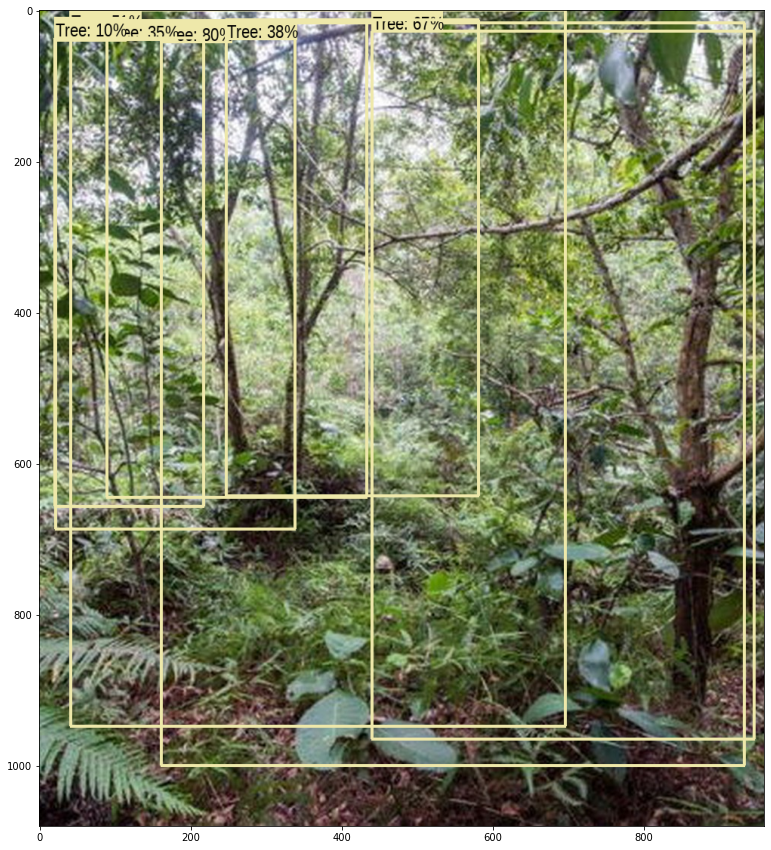

In [20]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

사람은 못 찾고 나무만 인식했다. 조금 더 쉬운 사진으로 해봐야겠다.    
   
### 사람과 동물 인식하기

Image downloaded to /tmp/tmpbr79t6d8.jpg.


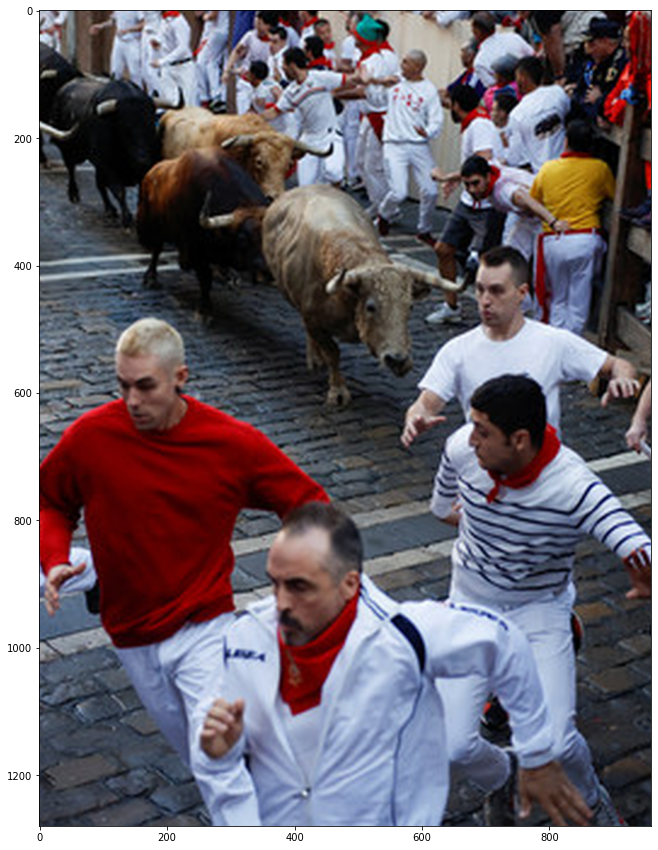

In [21]:
image_url = "https://cdn.kihoilbo.co.kr/news/photo/202207/987073_366383_253.jpeg"
downloaded_image_path = download_and_resize_image(image_url, 960, 1280, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  3.0383713245391846


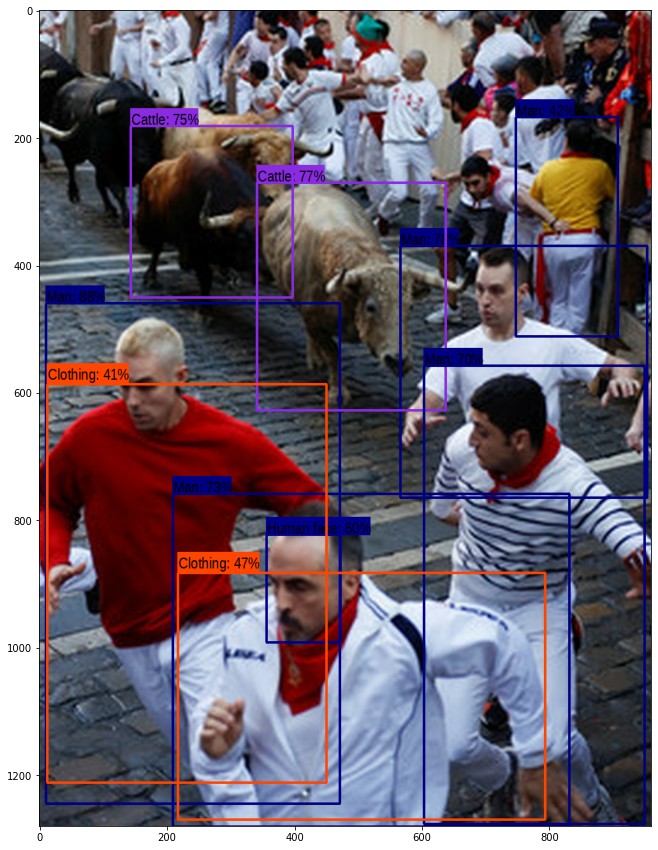

In [22]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

작은 사람들은 잘 인식하지 못했지만, 그래도 소와 앞쪽의 사람들과 옷은 잘 인식했다. 

## 2-2. 다양한 pre-trained model 테스트해보기
Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있습니다. tfhub을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.    
    
### mobilenet_v2 모델 

In [25]:
# 모델 불러오기
# [[YOUR CODE]]
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Image downloaded to /tmp/tmppgsvy8p3.jpg.


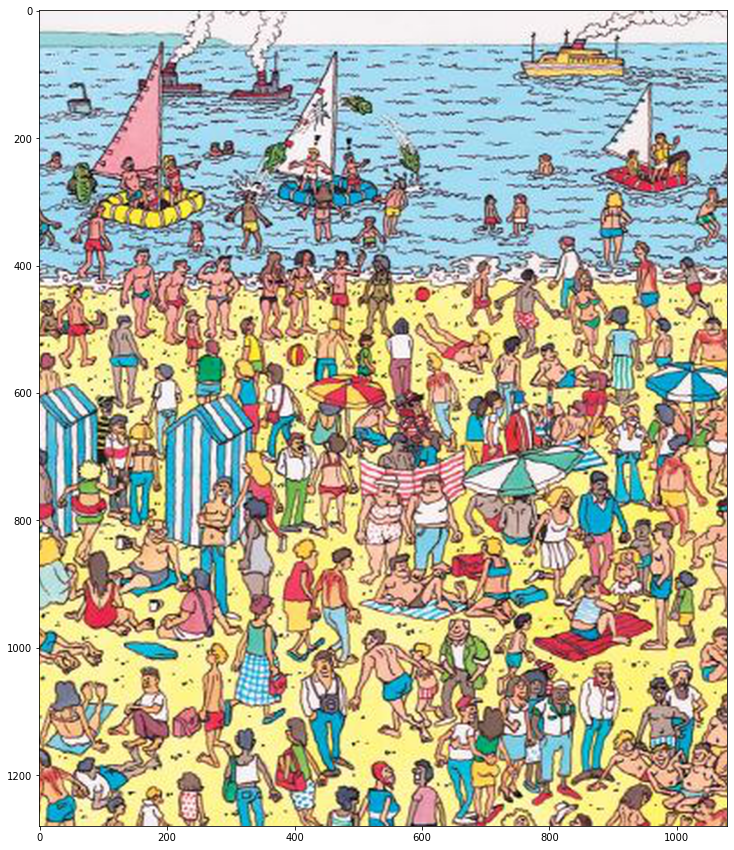

In [26]:
# 이미지 불러오기
# [[YOUR CODE]]
image_url = "https://cdn.gamey.kr/news/photo/201506/1624380_68023_2223.png"
downloaded_image_path = download_and_resize_image(image_url, 1080, 1280, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  6.6439337730407715


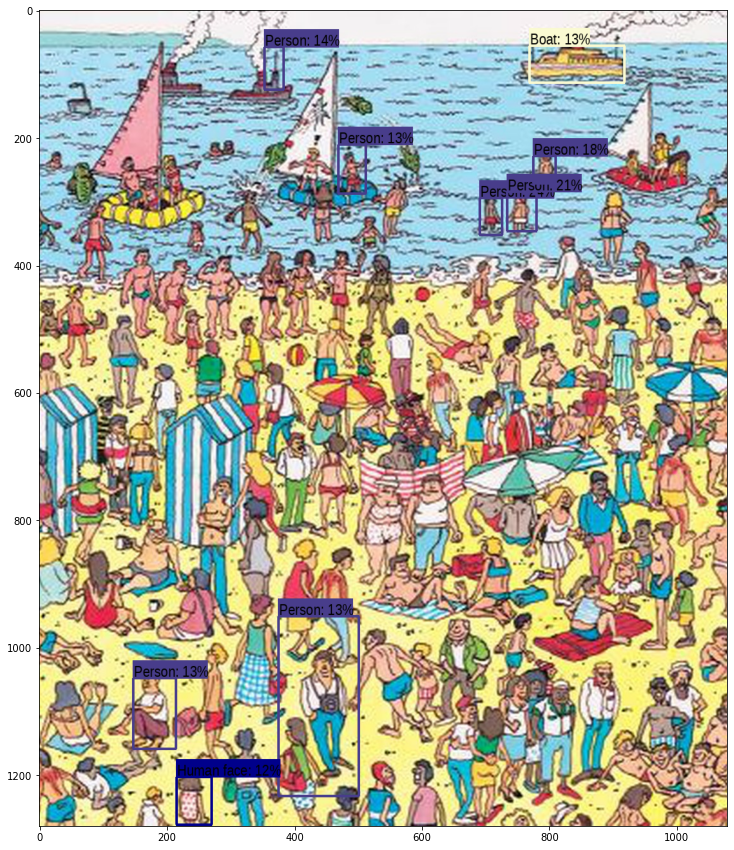

In [27]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmpalf96bes.jpg.


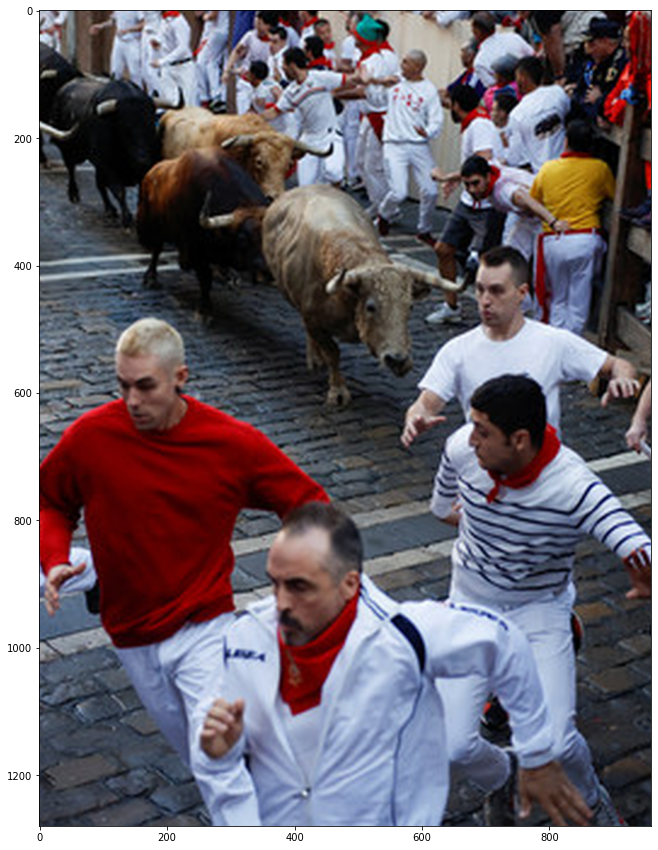

In [28]:
image_url = "https://cdn.kihoilbo.co.kr/news/photo/202207/987073_366383_253.jpeg"
downloaded_image_path = download_and_resize_image(image_url, 960, 1280, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  0.2820920944213867


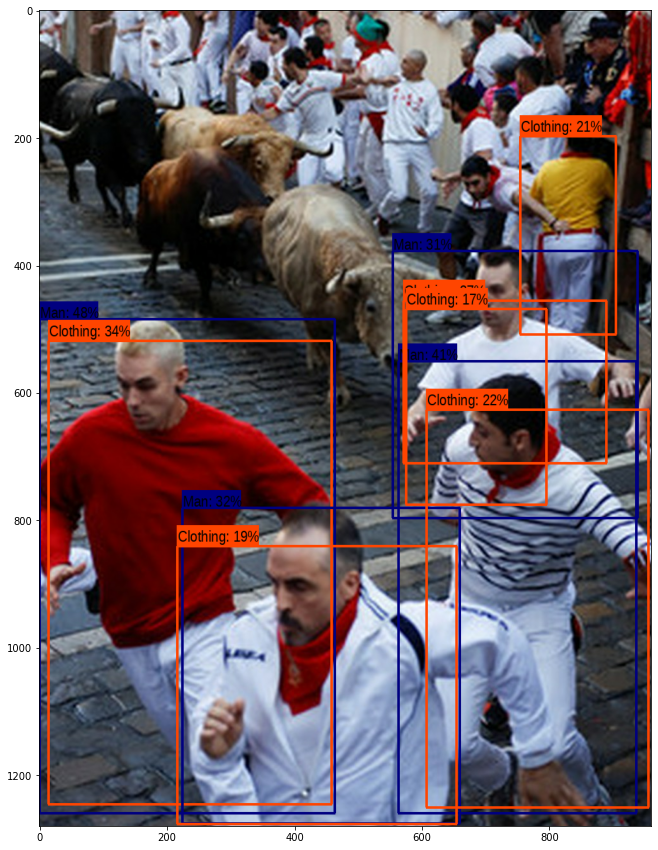

In [29]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

### 모델 결과 비교
- 윌리를 찾아서 그림에 inception_resnet_v2/1 썼을때는 사람 9명과 배 한 대를 인식했으나, mobilenet_v2 쓰니 사람 8명과 배 한대를 인식해 오히려 줄었다. 그러나 inception resnet보다 mobilenet이 더 작은 사람을 잘 인식한다는 것을 알 수 있다. 
- 소 축제 그림에서는 inception_resnet_v2/1 모델이 동물과 작은 사람을 더 정확하게 인식했고, mobilenet은 사람과 옷을 더 정확히 인식했다. 
- 하지만 전반적으로 사람, 옷 등 인식에 대한 확신은 inception_resnet_v2/1이 더 높았다. 

## 회고 

<헤맸던 부분>
- mobile_object_localizer_v1/1 모델 사용시 KeyError: 'detection_class_entities' 에러가 났다. 
- tfhub에서 대부분 모델이 404 error가 나서 결국 두 가지 모델만 결과를 볼 수 있었다. 

<새로 알게된 부분>
- OOM 에러 해결하는 방법
- tfhub에서 pre-trained model 사용하는게 생각보다 어렵다. 
- URL로 정 안되면 올라온 코드를 따는 방법도 있다. 
- 대부분 모델이 그림이 아닌 사진으로 학습했을 것이기 때문에, 그림보다 시진의 대상을 더 잘 인식할 수 밖에 없다. 

<아직도 모르는 것>
- 404 error 해결할 방법
- bounding block에서 인식한 대상의 이름이 겹쳤을 때, 그걸 다 볼 수 있는 방법은 없을까? -수경님 질문